### Import knihoven a konfigurace

In [ ]:
import os
import io

import cv2
import numpy as np
import matplotlib.pyplot as plt

from improutils import *
from google.cloud import vision
import pytesseract

%matplotlib inline
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

/shared-libs/python3.7/py/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/root/venv/lib/python3.7/site-packages/qrdet/qrdet.py:125: UserWarning: QRDetector has been updated to use the new YoloV8 model. Use legacy=True when calling detect for backwards compatibility with 1.x versions. Or update to new output (new output is a tuple of dicts, containing several new information (1.x output is accessible through 'bbox_xyxy' and 'confidence').Forget this message if you are reading it from QReader. [This is a first download warning and will be removed at 2.1]
  warn("QRDetector has been updated to use the new YoloV8 model. Use legacy=True when calling detect "


## Úkol

Výchozím bodem k tomuto úkolu je [cvičení na perspektivní transformaci](https://courses.fit.cvut.cz/BI-SVZ/tutorials/files/6/perspective-measuring-length.html).

### První část - rovnání dokumentu a následná aplikace OCR
Práce probíhá se souborem `ocr_img.jpg` na kterém se nachází dokument známých rozměrů (papír A4). Dokument je potřeba transformovat na kolmý pohled a následně využít Google Cloud Vision API k automatizovanému přečtení textu pomocí OCR. Za tuto část je možné získat maximálně **3 body** a **až 1 prémiový**.

![](ocr_img.jpg)

**1) Načtěte obrázek, zobrazte ho a uložte si pole cílových korespondečních souřadnic rohů dokumentu.**

Rozměry A4 jsou 210 x 297 mm. V pixelech toho nestačí, proto vynásobíme 10.

In [ ]:
image = load_image("ocr_img.jpg")

real_world_pts = np.array([(0, 0), (2100, 0), (0, 2970), (2100, 2970)]) #210 x 297 mm *10

**2) Pomocí oblíbeného grafického editoru vyberte obrazové souřadnice rohů dokumentu ve snímku.**  
Souřadnice musí korespondovat pořadím, takže pokud je levý roh první v předchozím poli, musí být první vybrán i v tomto kroku.

format: x, y 
 [[ 725 1118]
 [ 151  559]
 [1556  453]
 [ 976  118]]


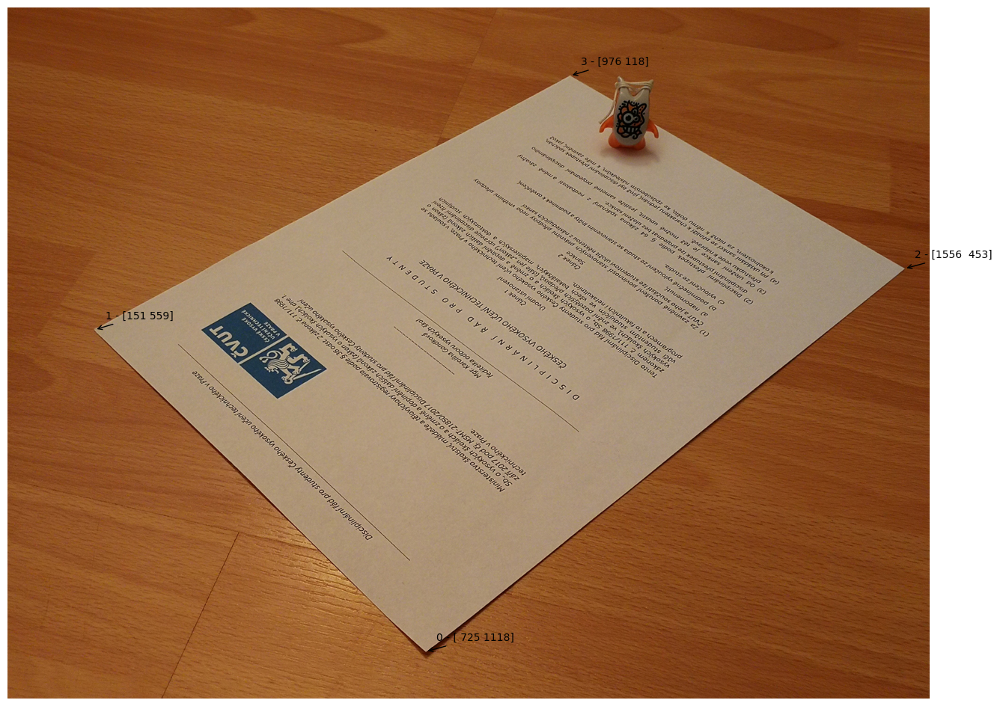

In [ ]:
image_pts = np.array([(725, 1118), (151, 559), (1556, 453), (976, 118)])

if (len(image_pts) != len(real_world_pts)):
    raise ValueError('Real world points and image points must be the same size.')

print('format: x, y \n', image_pts)

plot_images(image)
for i, pt in enumerate(image_pts):
    plt.annotate(str(i) + " - " + str(pt), xy=pt, textcoords="offset points", xytext=(10,10), arrowprops=dict(arrowstyle="->"))

**3) Vypočtěte transformační matici H, vypište její tvar.**

In [ ]:
H, mask = cv2.findHomography(image_pts, real_world_pts)
print(H)

[[-2.213 -2.766 4696.988]
 [2.446 -2.512 1034.816]
 [-0.000 0.001 1.000]]


**4) Popište rozdíl mezi [`cv2.getPerspectiveTransform()`](https://docs.opencv.org/3.4.1/da/d54/group__imgproc__transform.html#ga8c1ae0e3589a9d77fffc962c49b22043) a [`cv2.findHomography`](https://docs.opencv.org/3.4.1/d9/d0c/group__calib3d.html#ga4abc2ece9fab9398f2e560d53c8c9780).**

Obě vracejí 3x3 transformační matici, ale `cv2.getPerspectiveTransform()` pro to používá **právě** 4 korespondenční body, zatímco `cv2.findHomography()` používá alespoň 4 korespondenční body. Tedy `cv2.findHomography()` je vhodná v případě automatického nalezení korespondenčních bodů nějakým algoritmem. V našem případě můžeme použít jak `cv2.getPerspectiveTransform()`, tak i `cv2.findHomography()`.

In [ ]:
H2 = cv2.getPerspectiveTransform(np.float32(image_pts), np.float32(real_world_pts))
print(H)

[[-2.213 -2.766 4696.988]
 [2.446 -2.512 1034.816]
 [-0.000 0.001 1.000]]


**5) Využijte funkci [`cv2.warpPerspective`](https://docs.opencv.org/3.4.1/da/d54/group__imgproc__transform.html#gaf73673a7e8e18ec6963e3774e6a94b87) k vytvoření kolmého pohledu dokumentu, výsledek zobrazte a uložte.**

In [ ]:
warped_img = cv2.warpPerspective(image, H, (2100, 2970))

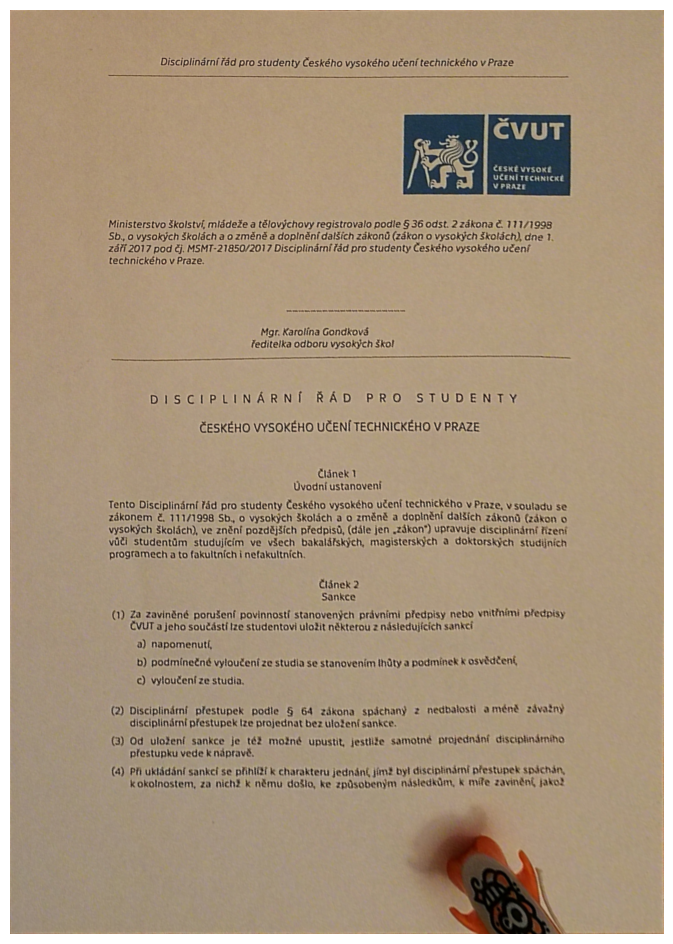

In [ ]:
plot_images(warped_img)

In [ ]:
save_image(warped_img, "warped_img.jpg")

True

**6) Zprovozněte si účet na Google Cloudu, abyste mohli využívat službu Cloud Vision API.**

Instrukce ke zprovoznění je k nalezení na [Courses](https://courses.fit.cvut.cz/BI-SVZ/tutorials/google-cloud.html).


**7) Detekujte text na "narovnaném" obraze pomocí níže uvedené funkce, text vypiště a uložte do textového souboru.** 

In [ ]:
def ocr_google(img_path):
    """Detects text in the file."""
    
    api_key = "api-key.json"
    assert os.path.exists(api_key), 'There is no API-KEY in your path! You need to contact google to get one.'
    client = vision.ImageAnnotatorClient.from_service_account_json(api_key)
    
    with io.open(img_path, 'rb') as image_file:
        content = image_file.read()

    image = vision.Image(content=content)
    response = client.text_detection(image=image)
    annotations = response.text_annotations

    return annotations

In [ ]:
text = pytesseract.image_to_string(warped_img, lang='ces')
print(text)

Disciplinární řád pro studenty Českého vysokého učení technického v Praze

ČVUT

ČESKÉ VYSOKÉ
A RLT
VAZ TV1:

 

Ministerstvo školství, mládeže a tělovýchovy registrovalo podle $ 36 odst. 2 zákona č 111/1998
Sb., o vysokých školách a o změně a doplnění dalších zákonů (zákon o vysokých školách) dne 1.
září 2017 pod čj. MSMT-21850/2017 Disciplinární řád pro studenty Českého vysokého učení
technického v Praze.

Mgr. Karolína Gondková
ředitelka odboru vysokých ško!

OAO AS AS do60neneen ooo otev

DISCIPLINÁRNÍ ŘÁD PRO STUDENTY

ČESKÉHO VYSOKÉHO UČENÍ TECHNICKÉHO V PRAZE

Článek l
Úvodní ustanovení

Tento Disciplinární řád pro studenty Českého vysokého učení technického v Praze, vsouladu se
zákonem č. 111/1998 Sb., o vysokých školách a o změně a doplnění dalších zákonů (zákon o
vysokých školách), ve znění pozdějších předpisů, (dále jen „zákon“) upravuje disciplinární řízení
vůči studentům studujícím ve všech bakalářských, magisterských a doktorských studijních
programech a to fakultních i n

In [ ]:
file = open("text.txt", "w")
a = file.write(text)
file.close()

#### Bonus k první části
Jak je vidět, výsledky po aplikaci OCR nejsou zcela uspokojivé. Je však v nutné brát potaz, že vstupní obraz není kromě geometrické transformace nijak dále předzpracován. Vzpomeňte si na cvičení, kde jsme aplikovali OCR s knihovnou Tesseract. Tam byly poměrně přísné nároky na vstupní obraz, který musel být perfektně předzpracovaný a v binární podobě. Tesseract je citlivý i na drobné natočení nebo deformování textu. Řešení od Google je v tomto ohledu značně robustnější.

**8) Pokuste se vstupní obraz před aplikací OCR kvalitněji předzpracovat pomocí probíraných technik - crop, segmentace, zaostření, rozmazání, jas, kontrast, apod. Fantazii se meze nekladou. Stručně diskutujte poznatky a vlivy jednotlivých operací na výslednou kvalitu. <span style="color:blue">(0.5 bodu)</span>**

**9) Využijte Google Cloud Translate API k přeložení výsledného textu do angličtiny, výsledek zobrazte a uložte do textového souboru. <span style="color:blue">(0.5 bodu)</span>**

### Druhá část - výtvarné umění na FITu
Práce probíhá s fotografií `fit_budova.jpg` od autora Tomáše Kouby a s malbou `fit_logo.jpg` od autora Lukáš Brchla. Cílem je umístit obrázek loga na stěnu budovy FITu viz obrázek. Za tuto část je možné získat maximálně **3 body** a **až 1 prémiový**.

![](fit_logo_merged.jpg)

**1) Načtěte obrázky a vytvořte pole korespondečních souřadnic rohů malby.**

In [ ]:
main_img = load_image("fit_budova.jpg")
logo_img = load_image("fit_logo.jpg")

logo_pts = np.array([(11, 10), (108, 10), (11, 710), (117, 710)]) 

**2) Vyberte souřadnice v obraze, do kterých má být logo transformováno (pozor na pořadí).**

format: x, y 
 [[191  39]
 [243  70]
 [ 86 403]
 [164 406]]


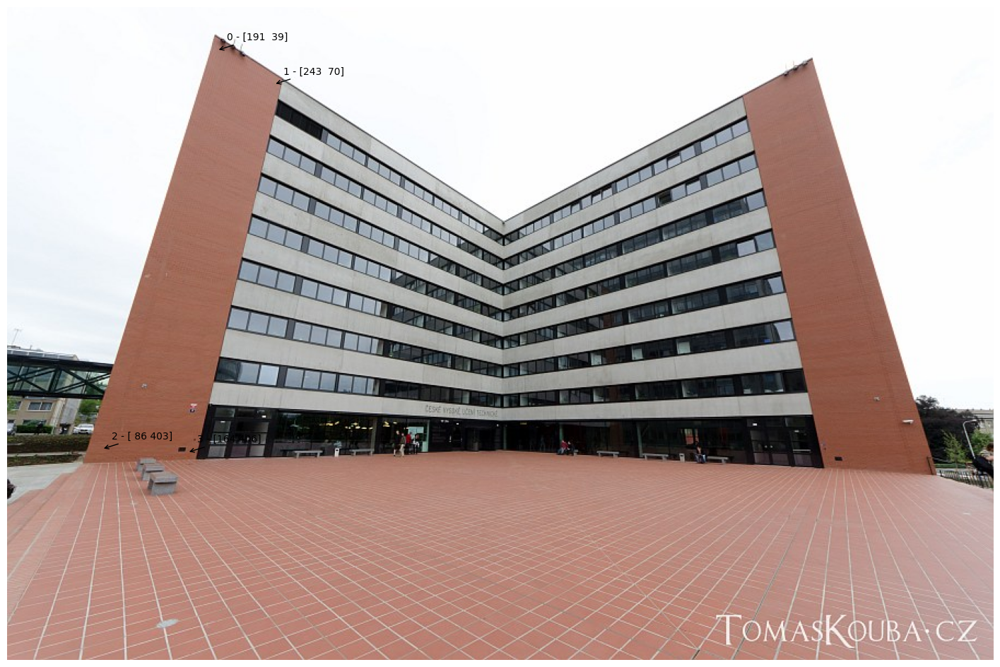

In [ ]:
image_pts = np.array([(191, 39), (243, 70), (86, 403), (164, 406)]) 
if (len(image_pts) != len(logo_pts)):
    raise ValueError('Real world points and image points must be the same size.')

print('format: x, y \n', image_pts)

plot_images(main_img)
for i, pt in enumerate(image_pts):
    plt.annotate(str(i) + " - " + str(pt), xy=pt, textcoords="offset points", xytext=(10,10), arrowprops=dict(arrowstyle="->"))

**3) Vypočtěte transformační matici H, vypište její tvar.**

In [ ]:
H, mask = cv2.findHomography(logo_pts, image_pts)
print(H)

[[0.756 -0.173 185.796]
 [0.384 0.421 30.845]
 [0.001 -0.000 1.000]]


**4) Využijte funkci `cv2.warpPerspective()` k vytvoření stejné perspektivy loga jako fotografie budovy. Zobrazte výsledky.**

Rozměry `main_img`, na který chceme přidat logo, jsou 900x596.

In [ ]:
warped_img = cv2.warpPerspective(logo_img, H, (900, 596)) 

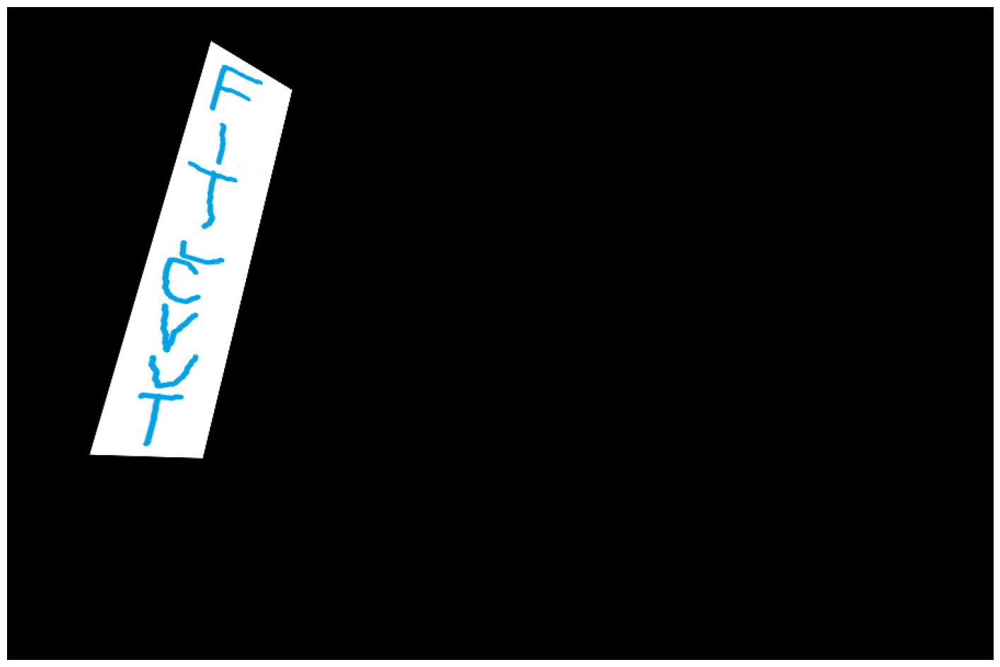

In [ ]:
plot_images(warped_img)

**5) Logo je nutné umístit na budovu bez bílého pozadí, je tedy nutné ho segmentovat.**

Tady se mohou vaše postupy lišit. Kvalita segmentace následně razantně rozhoduje o kvalitě výsledku. Zkuste experimentovat s různými druhy segmentace a zkuste využít i nějaké funkce pro předzpracování, jako např. rozmazání. Může se vám hodit funkce `cv2.bitwise_and`.

Použil jsem mediánový filtr k redukci šumu na obrázku. Tento filtr nahradí hodnotu každého pixelu mediánem hodnot sousedních $k$ pixelů. Po několika pokusech jsem zvolil $k = 5$

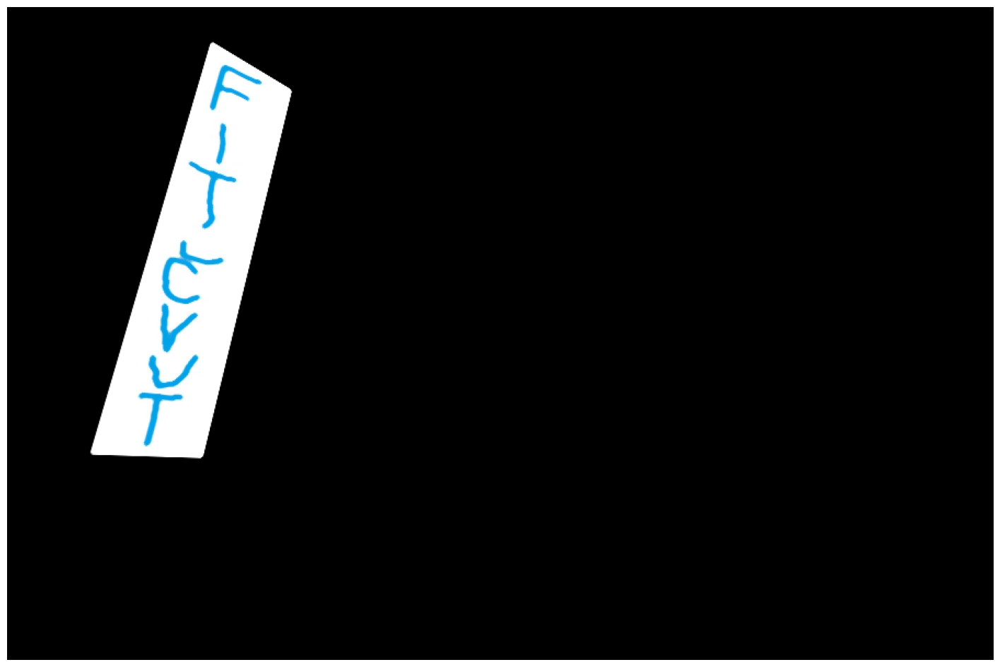

In [ ]:
filtered_img = cv2.medianBlur(warped_img, 5) #remove noise from an mask using the cv2.medianBlur()
plot_images(filtered_img)

Jak i v předchozím úkolu, i zde jsem pro segmentaci použil funkci `segmentation_two_thresholds` k vysegmentování loga. U tohoto obrázku výsledná kvalita segmentace závisela na stanovení vyšší hodnoty saturace pro dolní hranici. Větší hodnota výrazně snižuje šum vedle písmen.

In [ ]:
warped_img_hsv = to_hsv(filtered_img)
lower_bound = (to_intensity(198), 224, 225)
upper_bound = (to_intensity(240), 255, 255)

mask = segmentation_two_thresholds(warped_img_hsv, lower_bound, upper_bound) 

Abych aplikoval masku na obrázek, použil jsem funkci `cv2.bitwise_and` na stejný obrázek, ale s maskou z předchozí buňky. 

Funkce `cv2.bitwise_and` funguje tak, že vezme bod z masky a odpovídající bod z obrázku. Pokud je pixel v masce nenulový, zachová hodnotu pixelu z obrázku. V opačném případě nastaví hodnotu pixelu ve výstupním obrázku na nulu.

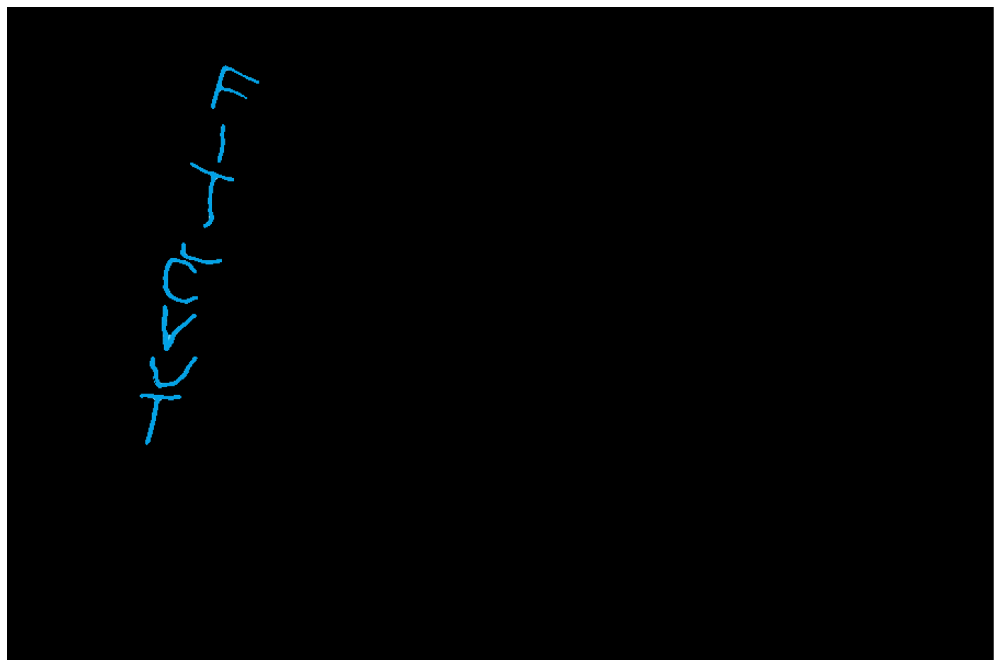

In [ ]:
warped_img1 = cv2.bitwise_and(warped_img, warped_img, mask = mask)
plot_images(warped_img1)

**6) Spojte zdrojovou fotografii budovy se segmentovaným logem. Výsledek zobrazte a uložte.**

Využijte operace numpy či opencv, pozor ať je zachována úroveň jasu. 

Obrázky jsem spojil tak, že nejprve jsem aplikoval invertovanou masku z předchozího bodu na hlavní obrázek. Tím jsem získal černé logo na obrázku. Poté jsem využil funkci [cv2.add](https://readthedocs.org/projects/opencv24-python-tutorials/downloads/pdf/latest/), která pomocí saturativního součtu spojila `add_black` obrázek s `warped_img1`, na který je aplikována maska. Černé (nulové) pixely ve výsledném součtu těchto obrázků neporuší jas a získáme docela kvalitní výsledný obrázek.

In [ ]:
add_black = cv2.bitwise_and(main_img, main_img, mask = cv2.bitwise_not(mask))
merged_img = cv2.add(warped_img1, add_black)

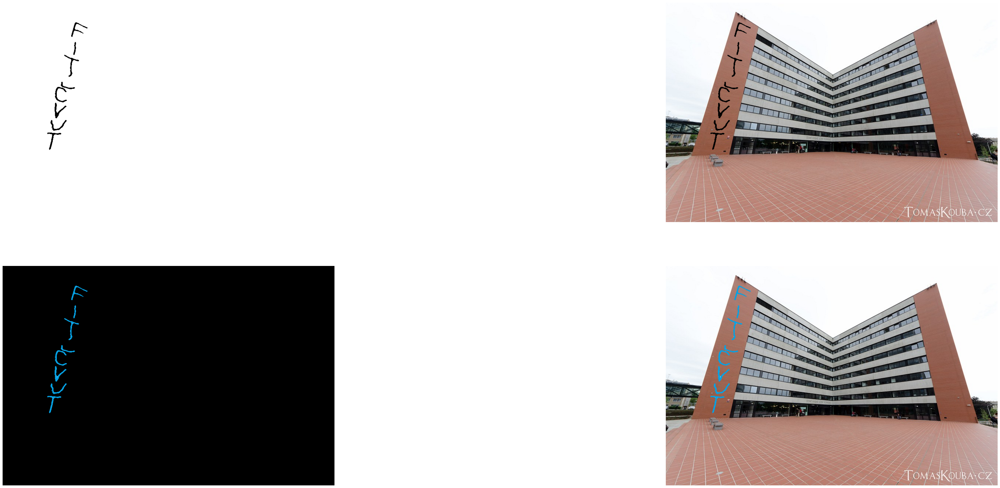

In [ ]:
plot_images(cv2.bitwise_not(mask), add_black, warped_img1, merged_img)

### Výsledný obrázek

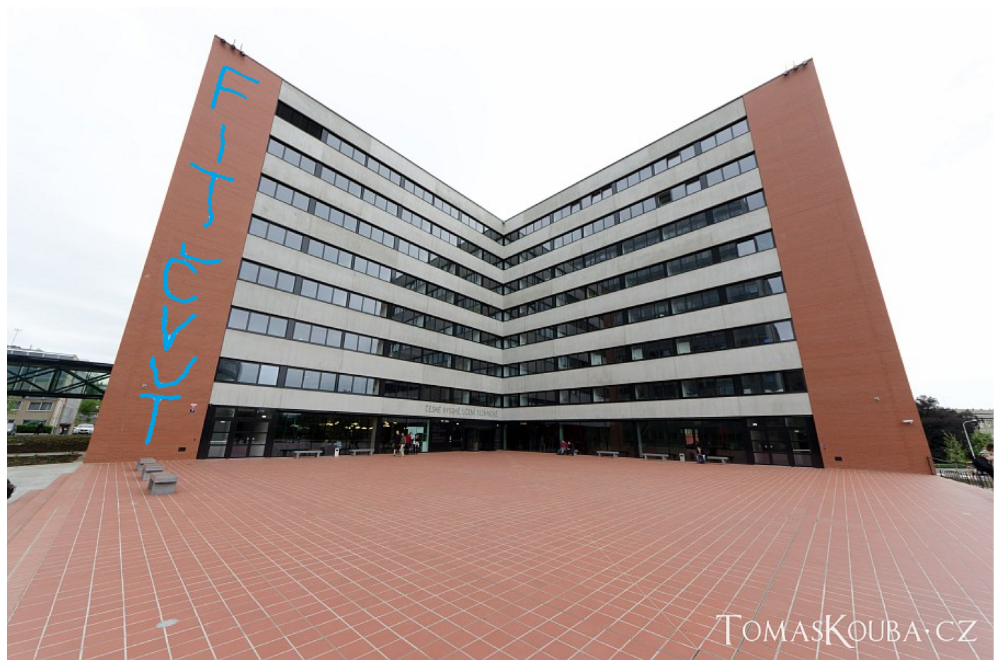

In [ ]:
plot_images(merged_img)

Napsal jsem i jiný způsob výpočtu. Z toho důvodu, že máme stejně velké obrázky a logo je dobře vysegmentované, můžeme jednoduše projít celý `main_img` a pixely, které odpovídají **ne**černým pixelům v obrázku s logem, nahradit pixely z obrázku s logem. Výsledek bude stejný.

In [ ]:
def blend_images(img1, img2):
    new_main = img1.copy()
    for i in range(0, 596):
        for j in range(0, 900):
            if img2[i][j][0] != 0 or img2[i][j][1] != 0 or img2[i][j][2] != 0:
                new_main[i][j] = img2[i][j]
    return new_main

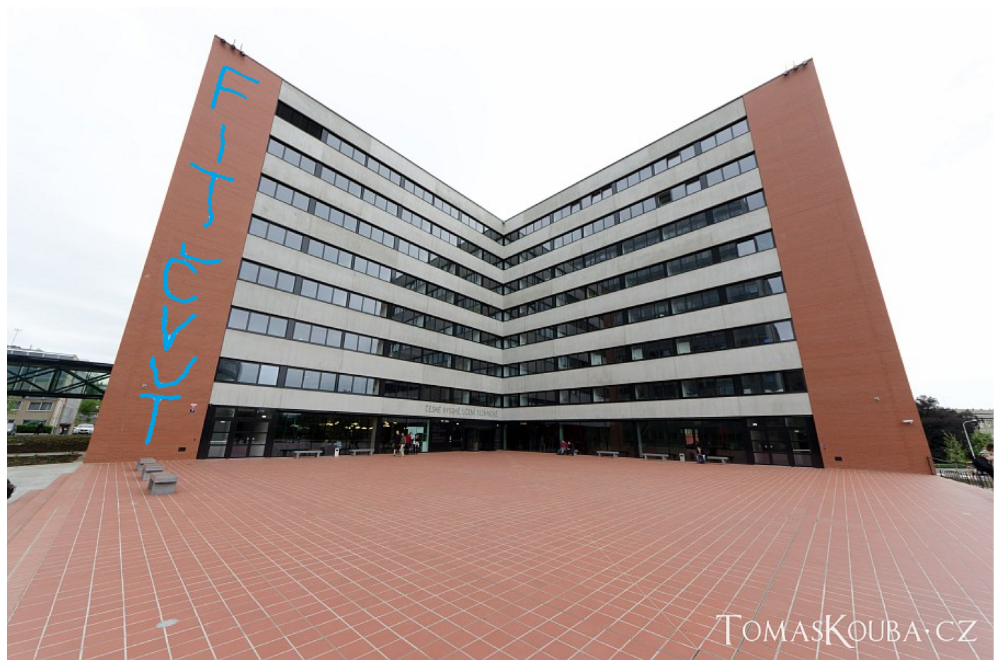

In [ ]:
new_main = blend_images(main_img, warped_img1)
plot_images(new_main)

#### Bonus k druhé části
**7) Vymyslete a naprogramujte další využití perspektivní transformace pro nadcházející studenty BI-SVZ. Pro získání nápadu se lze odpíchnout od témat spojování snímků (panorama), rozšířené reality a 3D rekonstrukce. Pokud vůbec netušíte, hledejte v Google images klíčová slova "homography" nebo "perspective transform". Znovu podotýkám, že fantazii se meze nekladou a nebojte se případné dotazy/nápady konzultovat přímo s námi! <span style="color:blue">(1 bod)</span>**


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=abbe96f9-f723-4652-ac26-a750149877dd' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>